In [2]:
#import lightgbm
import random
import pandas as pd
import numpy as np
import os
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
from tqdm import tqdm
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.utils.plotting import plot_series
from xgboost import XGBRegressor
import time
from sklearn.metrics import make_scorer
t = time.strftime('%m%d-%H%M', time.localtime(time.time()))
import warnings
warnings.filterwarnings(action='ignore')

def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)

seed_everything(42) # Seed 고정

def weighted_mse(alpha = 1):
    def weighted_mse_fixed(label, pred):
        residual = (label - pred).astype("float")
        grad = np.where(residual>0, -2*alpha*residual, -2*residual)
        hess = np.where(residual>0, 2*alpha, 2.0)
        return grad, hess
    return weighted_mse_fixed

 #점수 측정을 위한 코드  
def SMAPE(y_true, y_pred):
    return 100/len(y_true) * np.sum(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

  0%|          | 0/100 [00:00<?, ?it/s]

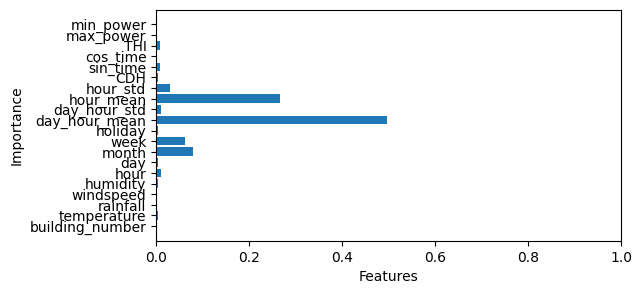

  1%|          | 1/100 [00:03<05:26,  3.30s/it]

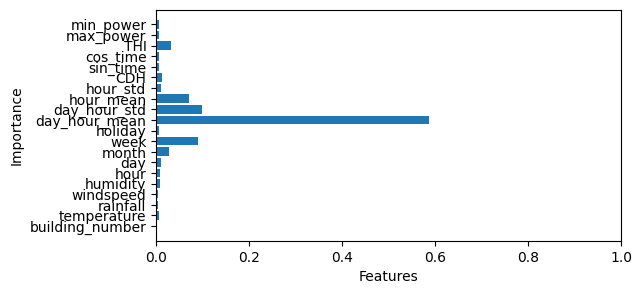

  2%|▏         | 2/100 [00:04<03:47,  2.32s/it]

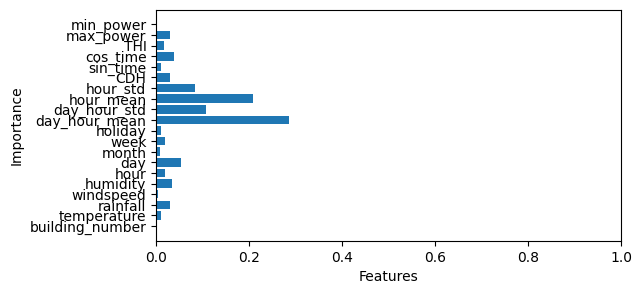

  3%|▎         | 3/100 [00:07<03:48,  2.36s/it]

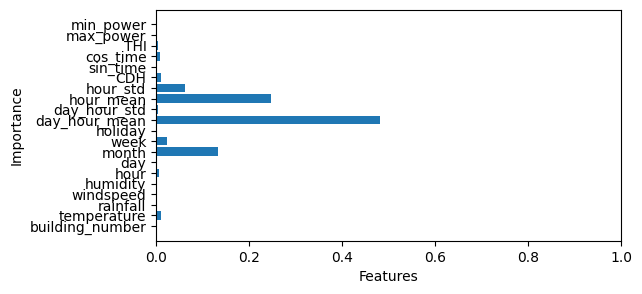

  4%|▍         | 4/100 [00:11<05:13,  3.27s/it]

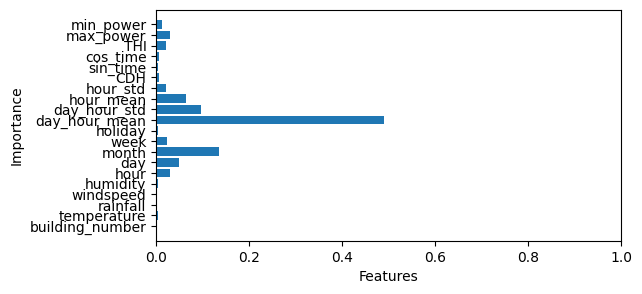

  5%|▌         | 5/100 [00:14<04:28,  2.82s/it]

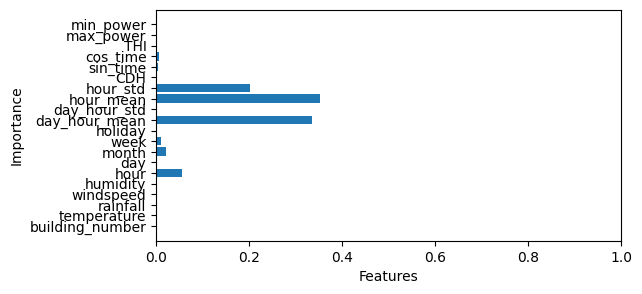

  6%|▌         | 6/100 [00:18<05:19,  3.40s/it]

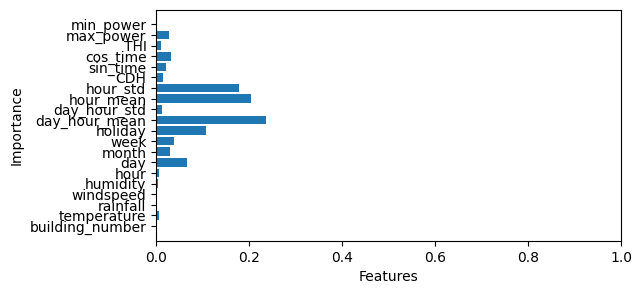

  7%|▋         | 7/100 [00:21<04:50,  3.12s/it]

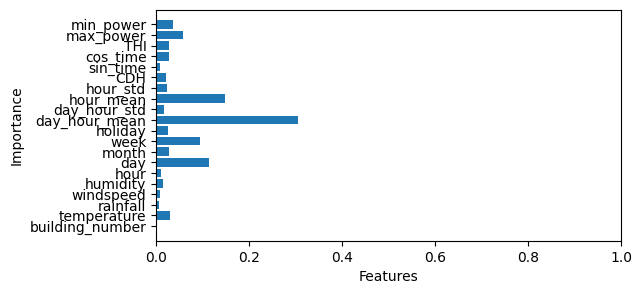

  8%|▊         | 8/100 [00:26<05:40,  3.71s/it]

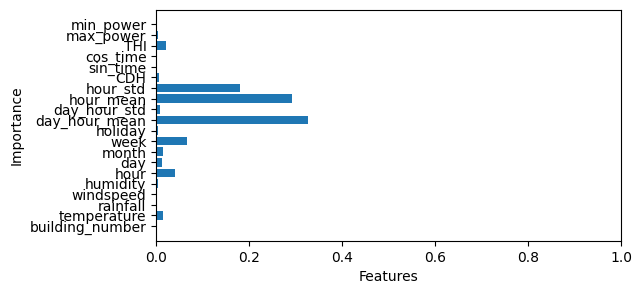

  9%|▉         | 9/100 [00:29<05:35,  3.69s/it]

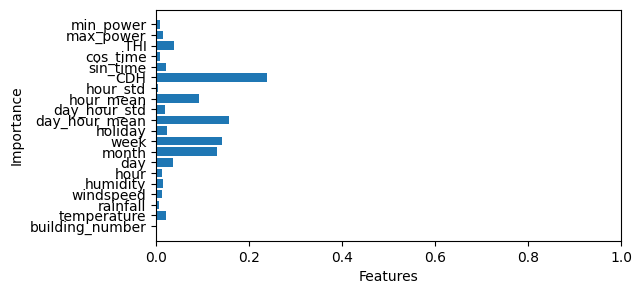

 10%|█         | 10/100 [00:33<05:44,  3.83s/it]

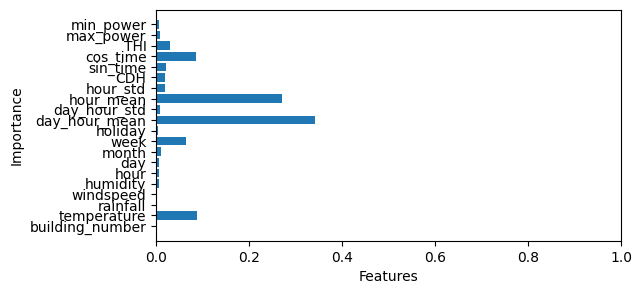

 11%|█         | 11/100 [00:36<05:21,  3.61s/it]

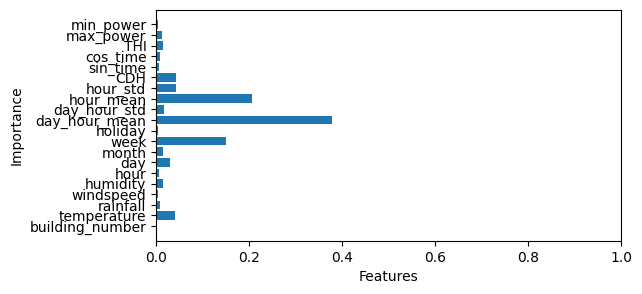

 12%|█▏        | 12/100 [00:40<05:06,  3.48s/it]

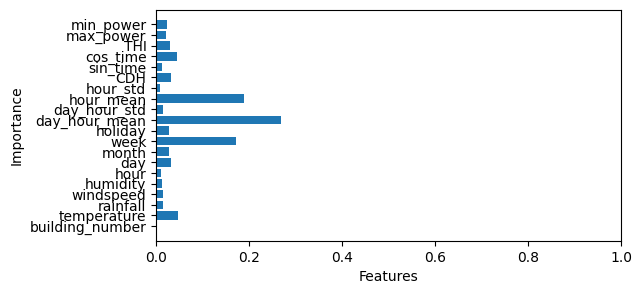

 13%|█▎        | 13/100 [00:45<06:02,  4.16s/it]

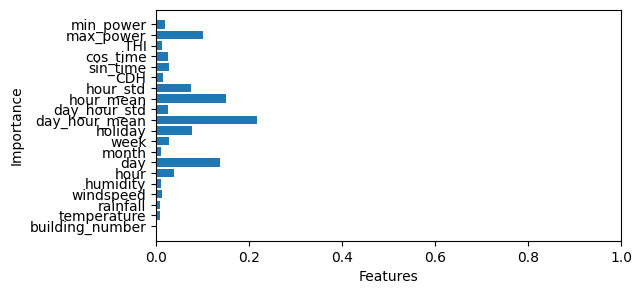

 14%|█▍        | 14/100 [00:48<05:17,  3.69s/it]

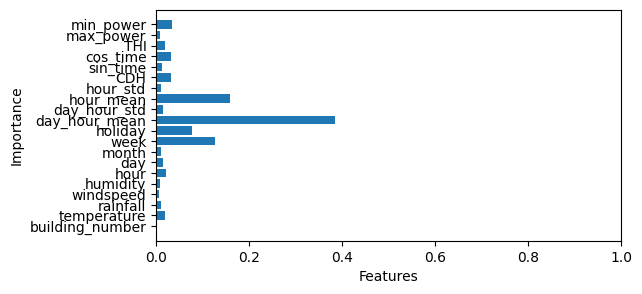

 15%|█▌        | 15/100 [00:51<05:03,  3.57s/it]

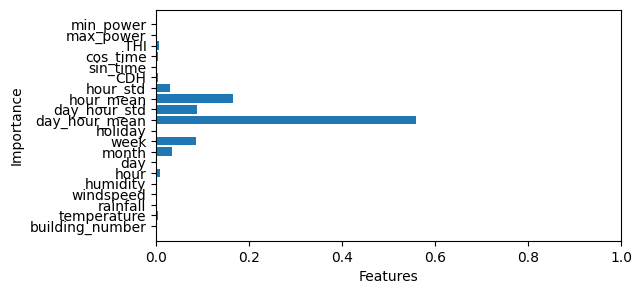

 16%|█▌        | 16/100 [00:58<06:08,  4.39s/it]

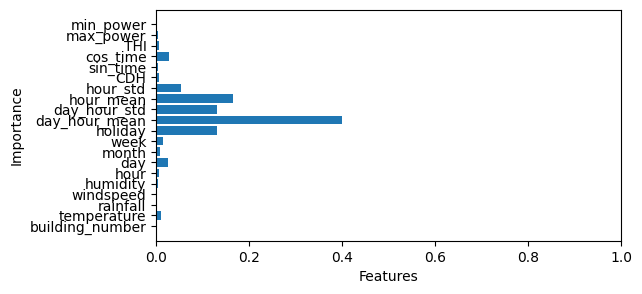

 17%|█▋        | 17/100 [00:59<04:57,  3.59s/it]

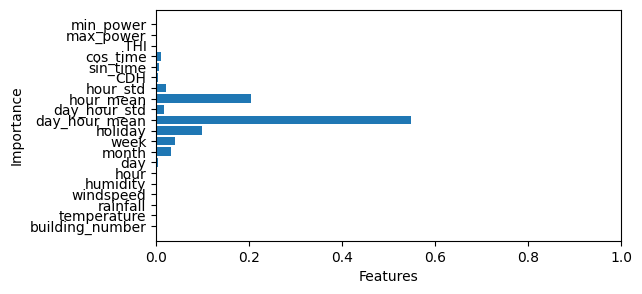

 18%|█▊        | 18/100 [01:04<05:17,  3.87s/it]

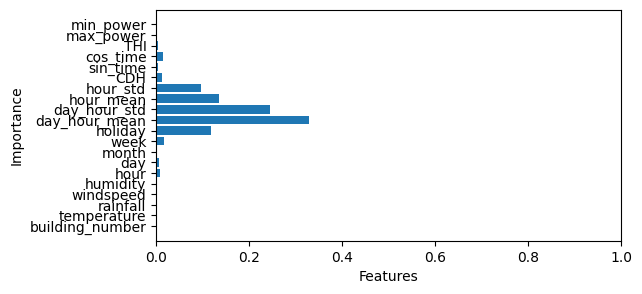

 19%|█▉        | 19/100 [01:06<04:37,  3.43s/it]

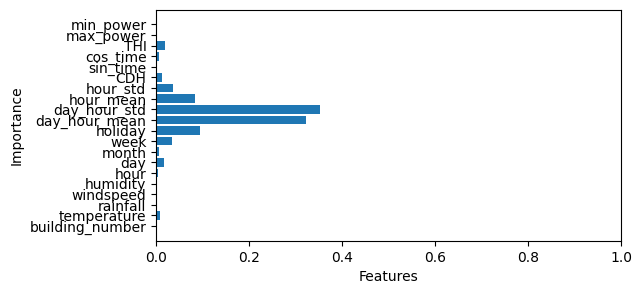

 20%|██        | 20/100 [01:09<04:08,  3.11s/it]

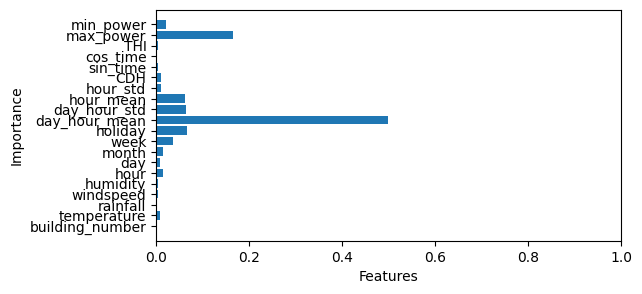

 21%|██        | 21/100 [01:12<04:21,  3.31s/it]

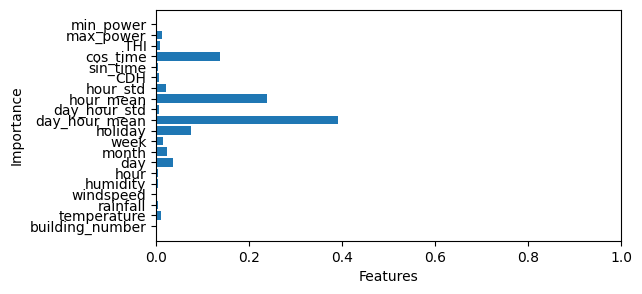

 22%|██▏       | 22/100 [01:16<04:25,  3.41s/it]

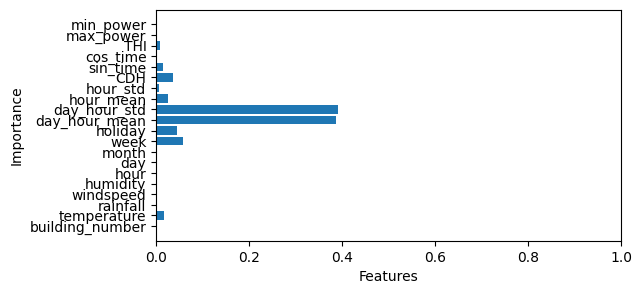

 23%|██▎       | 23/100 [01:19<04:13,  3.30s/it]

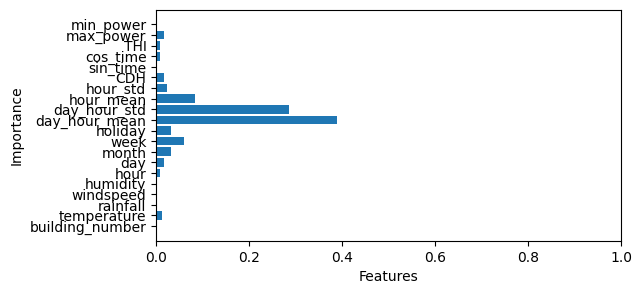

 24%|██▍       | 24/100 [01:20<03:24,  2.69s/it]

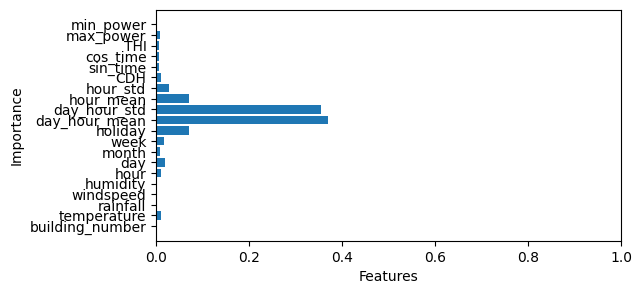

 25%|██▌       | 25/100 [01:24<03:37,  2.90s/it]

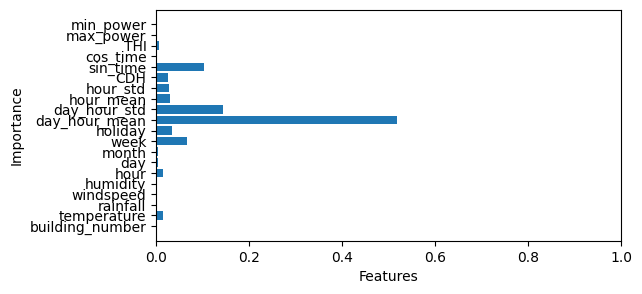

 26%|██▌       | 26/100 [01:28<03:55,  3.18s/it]

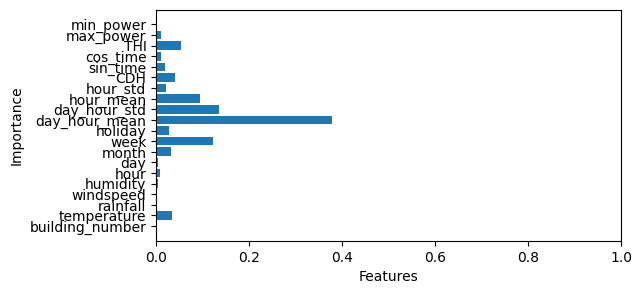

 27%|██▋       | 27/100 [01:32<04:15,  3.50s/it]

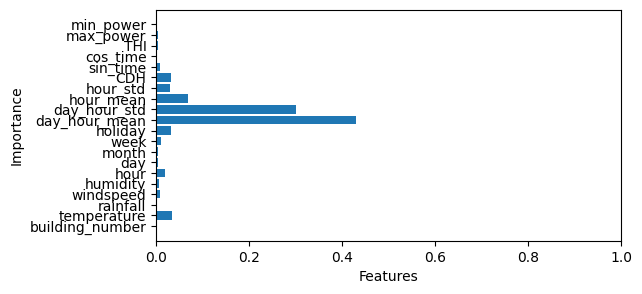

 28%|██▊       | 28/100 [01:35<04:00,  3.34s/it]

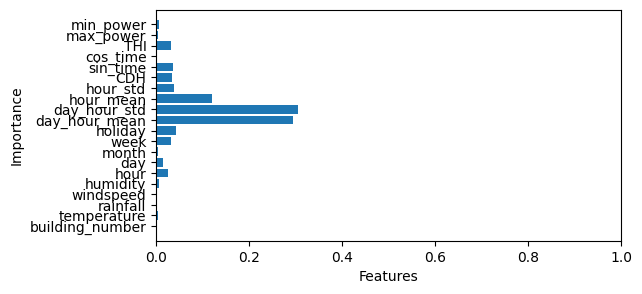

 29%|██▉       | 29/100 [01:36<03:06,  2.63s/it]

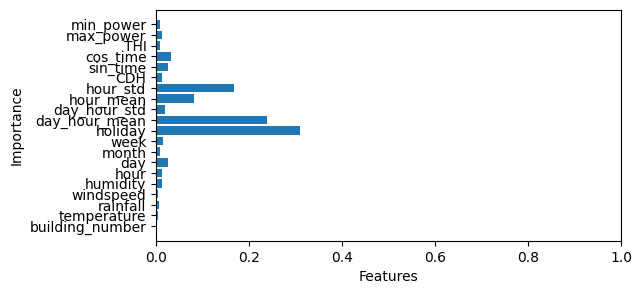

 30%|███       | 30/100 [01:39<03:16,  2.81s/it]

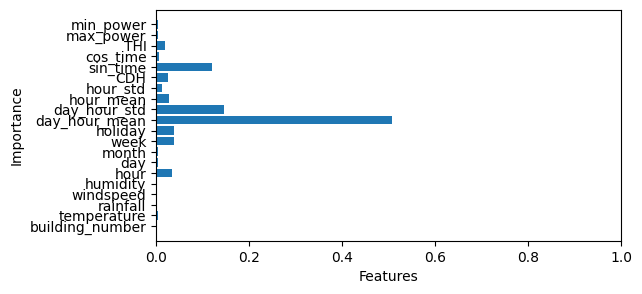

 31%|███       | 31/100 [01:42<03:17,  2.86s/it]

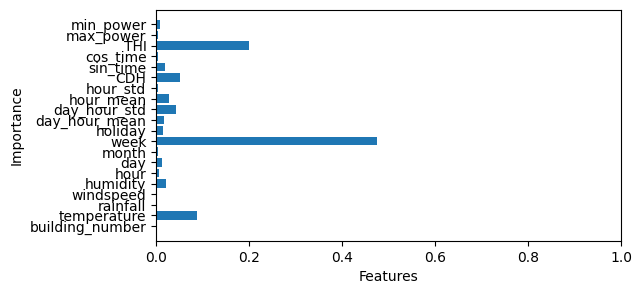

 32%|███▏      | 32/100 [01:47<03:50,  3.39s/it]

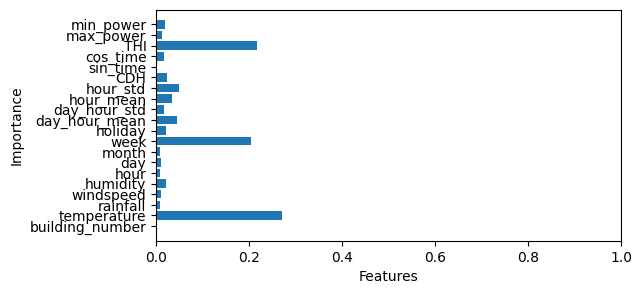

 33%|███▎      | 33/100 [01:49<03:21,  3.01s/it]

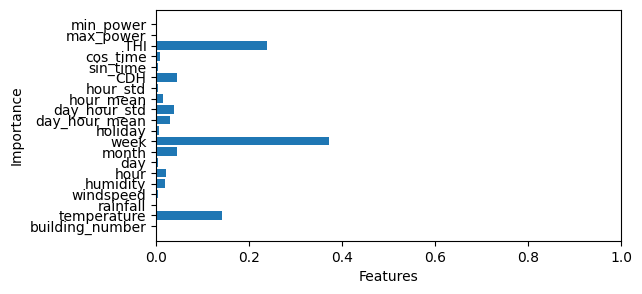

 34%|███▍      | 34/100 [01:53<03:52,  3.52s/it]

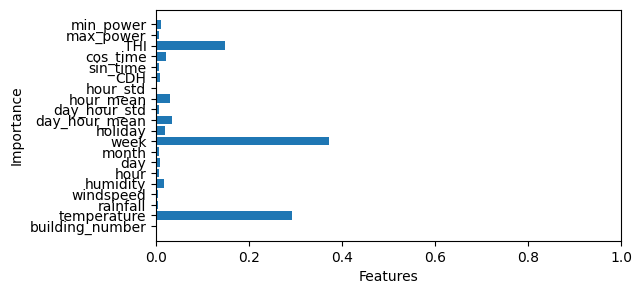

 35%|███▌      | 35/100 [01:59<04:21,  4.02s/it]

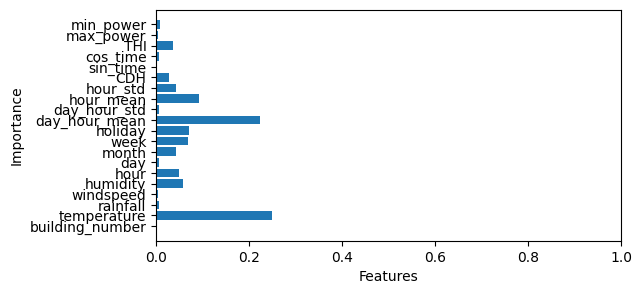

 36%|███▌      | 36/100 [02:09<06:12,  5.82s/it]

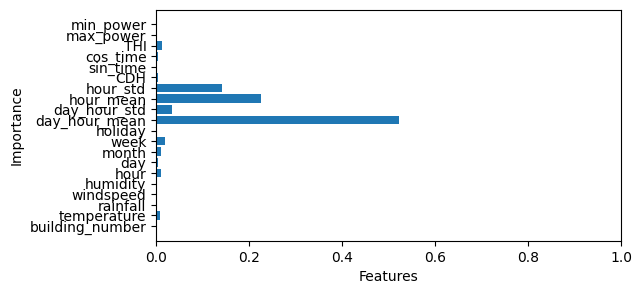

 37%|███▋      | 37/100 [02:13<05:37,  5.35s/it]

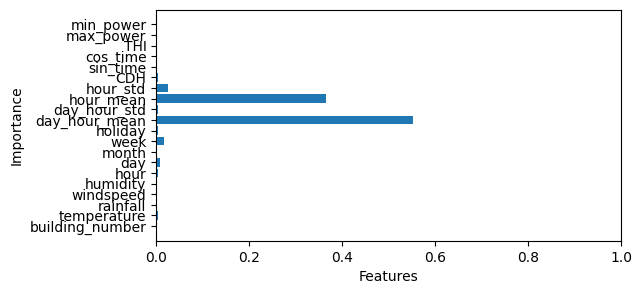

 38%|███▊      | 38/100 [02:23<06:57,  6.74s/it]

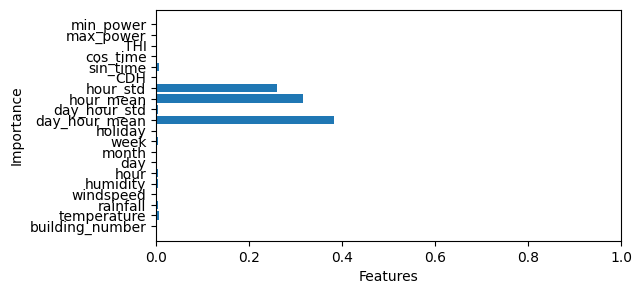

 39%|███▉      | 39/100 [02:29<06:42,  6.60s/it]

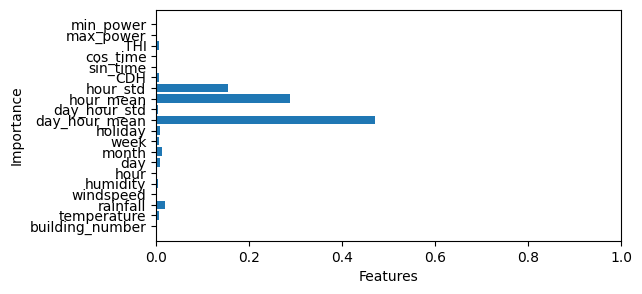

 40%|████      | 40/100 [02:34<05:56,  5.94s/it]

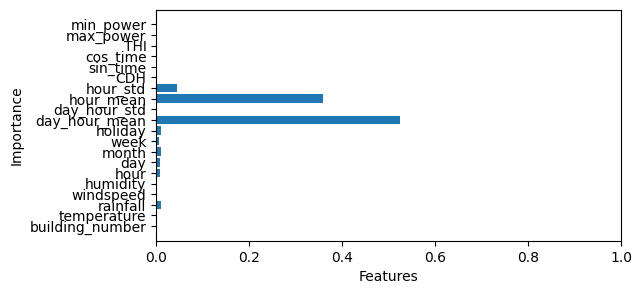

 41%|████      | 41/100 [02:39<05:43,  5.82s/it]

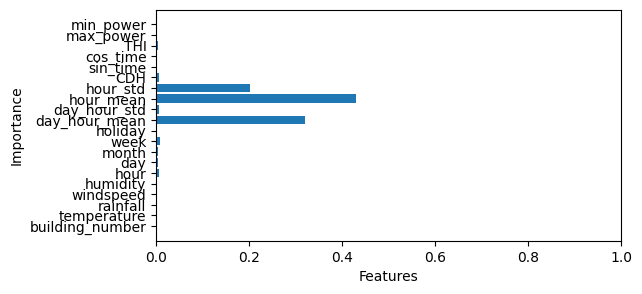

 42%|████▏     | 42/100 [02:46<05:59,  6.20s/it]

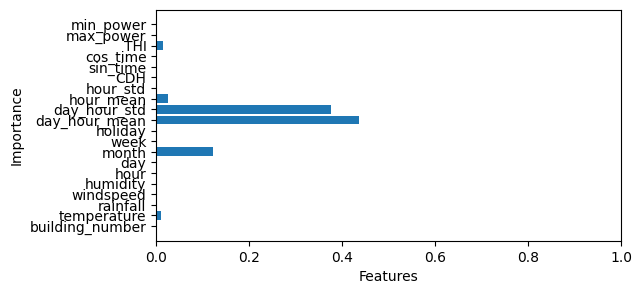

 43%|████▎     | 43/100 [02:51<05:33,  5.85s/it]

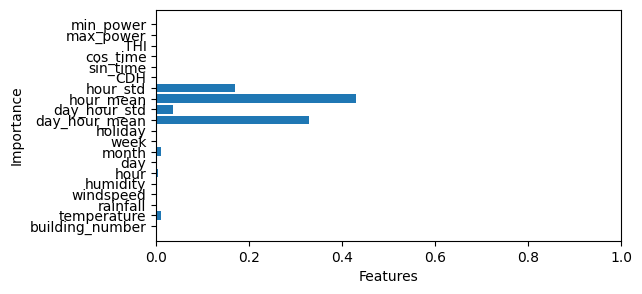

 44%|████▍     | 44/100 [02:57<05:25,  5.81s/it]

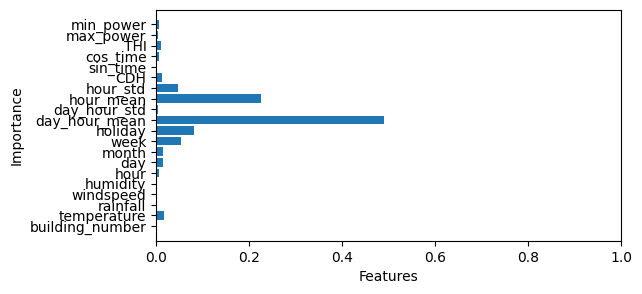

 45%|████▌     | 45/100 [03:02<05:15,  5.74s/it]

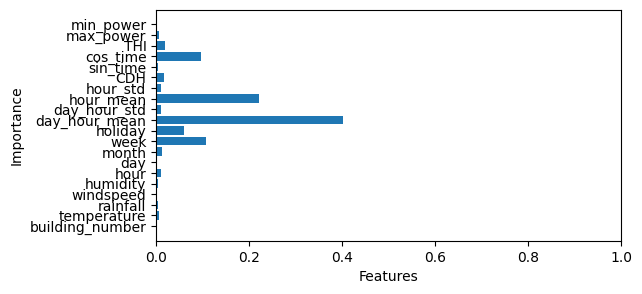

 46%|████▌     | 46/100 [03:06<04:29,  4.99s/it]

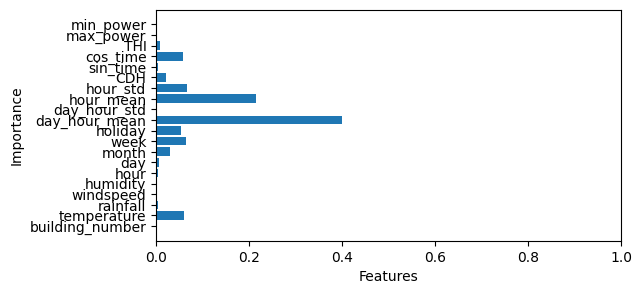

 47%|████▋     | 47/100 [03:07<03:26,  3.89s/it]

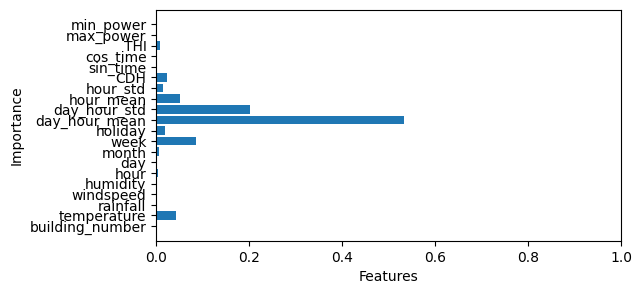

 48%|████▊     | 48/100 [03:09<02:54,  3.36s/it]

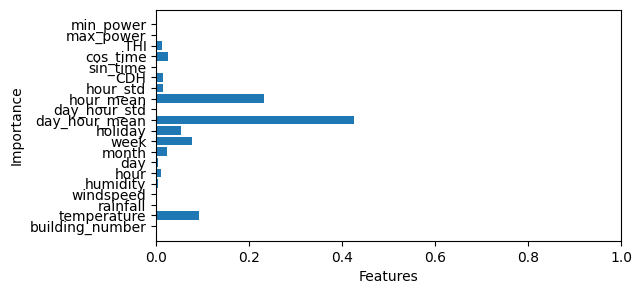

 49%|████▉     | 49/100 [03:16<03:47,  4.46s/it]

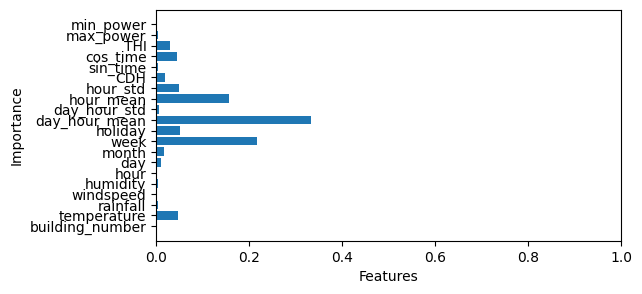

 50%|█████     | 50/100 [03:21<03:42,  4.45s/it]

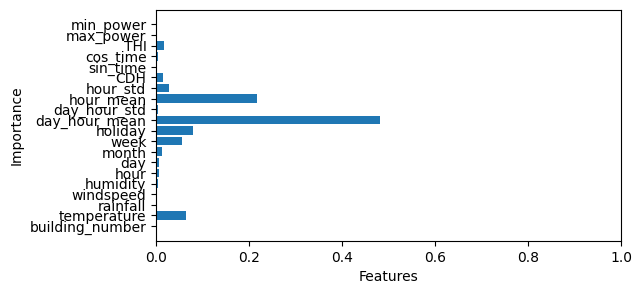

 51%|█████     | 51/100 [03:25<03:36,  4.43s/it]

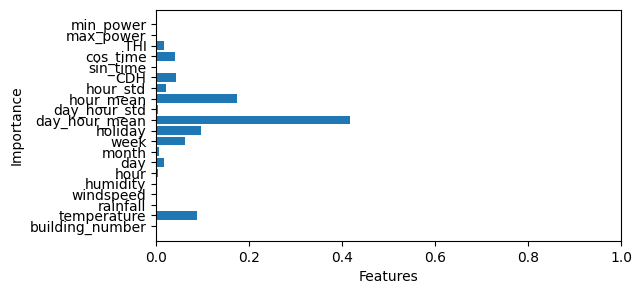

 52%|█████▏    | 52/100 [03:29<03:31,  4.41s/it]

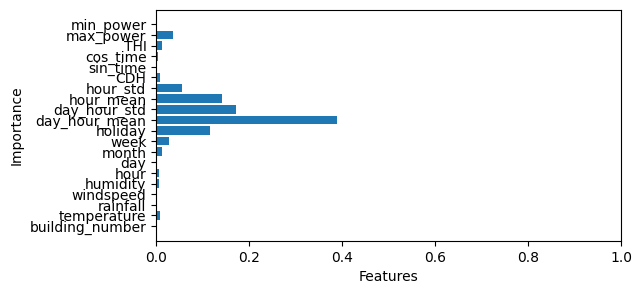

 53%|█████▎    | 53/100 [03:32<03:01,  3.86s/it]

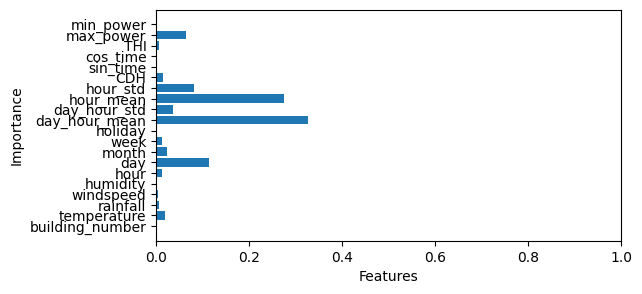

 54%|█████▍    | 54/100 [03:34<02:32,  3.32s/it]

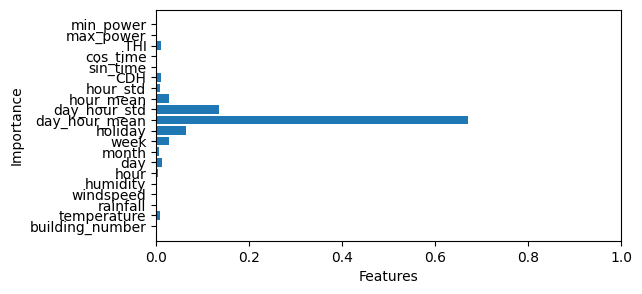

 55%|█████▌    | 55/100 [03:36<02:09,  2.89s/it]

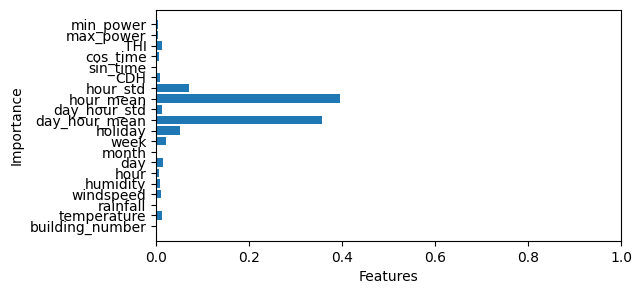

 56%|█████▌    | 56/100 [03:41<02:37,  3.58s/it]

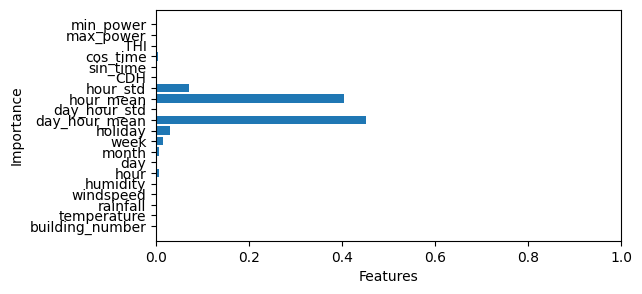

 57%|█████▋    | 57/100 [03:44<02:25,  3.38s/it]

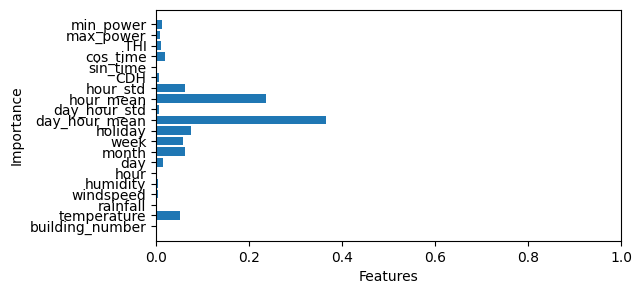

 58%|█████▊    | 58/100 [03:50<02:50,  4.06s/it]

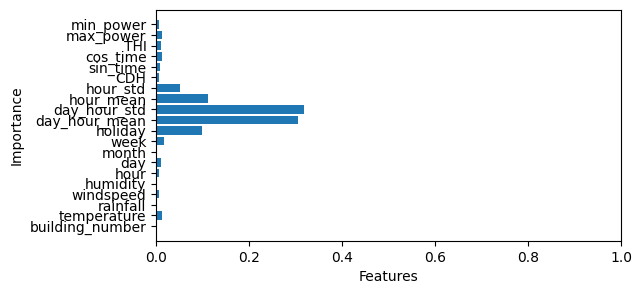

 59%|█████▉    | 59/100 [03:51<02:16,  3.34s/it]

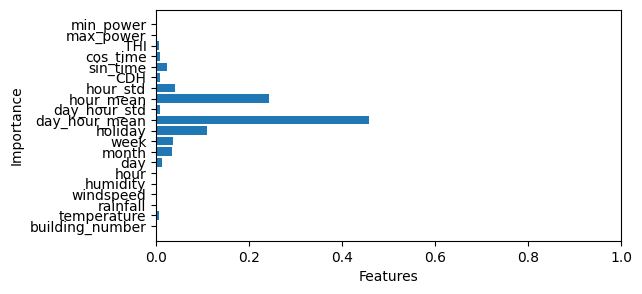

 60%|██████    | 60/100 [03:56<02:28,  3.72s/it]

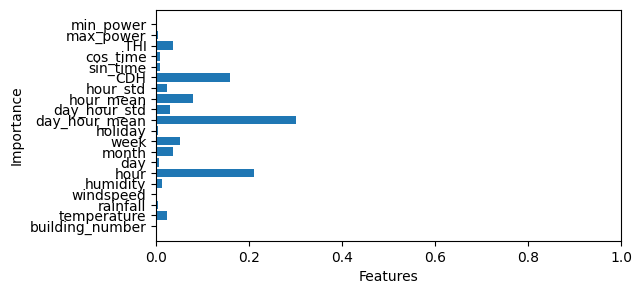

 61%|██████    | 61/100 [04:00<02:25,  3.73s/it]

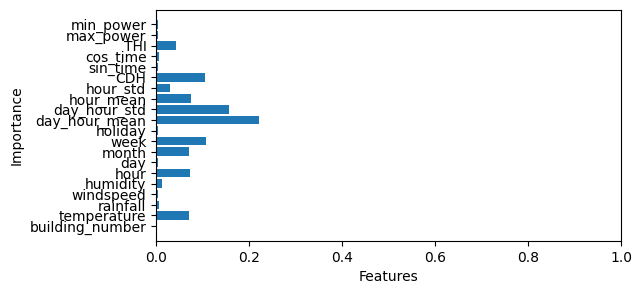

 62%|██████▏   | 62/100 [04:03<02:15,  3.58s/it]

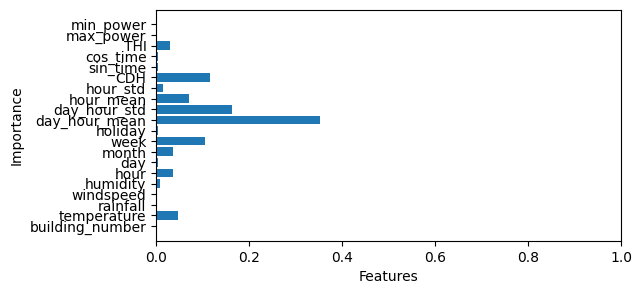

 63%|██████▎   | 63/100 [04:05<01:58,  3.19s/it]

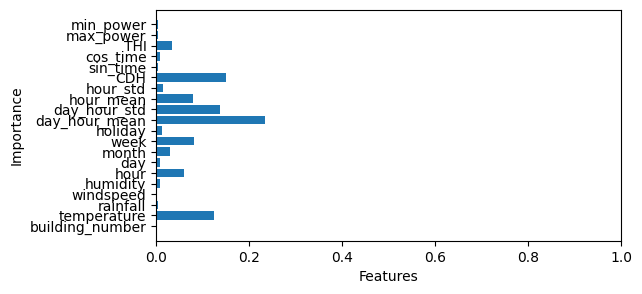

 64%|██████▍   | 64/100 [04:09<02:00,  3.34s/it]

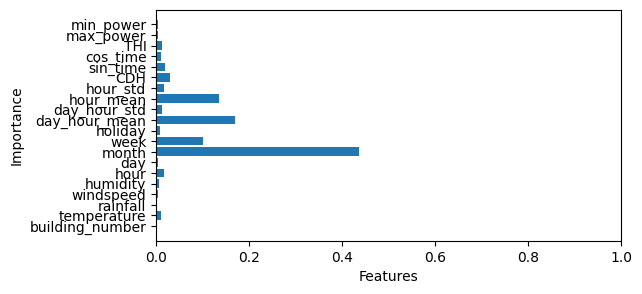

 65%|██████▌   | 65/100 [04:18<02:53,  4.96s/it]

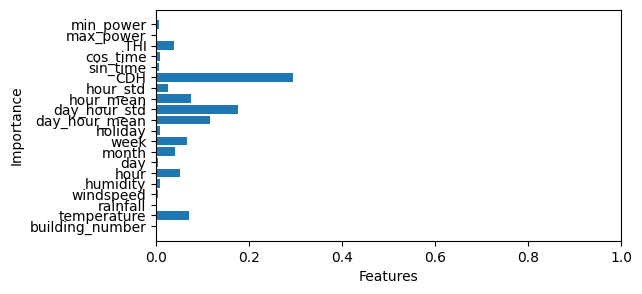

 66%|██████▌   | 66/100 [04:23<02:53,  5.10s/it]

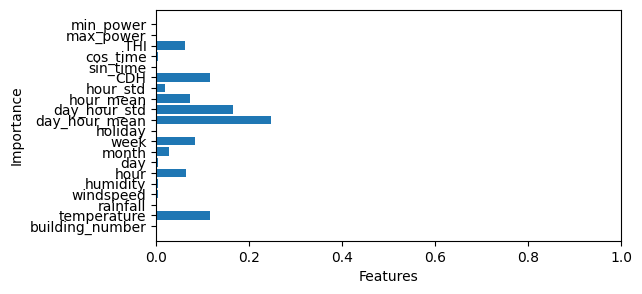

 67%|██████▋   | 67/100 [04:25<02:21,  4.28s/it]

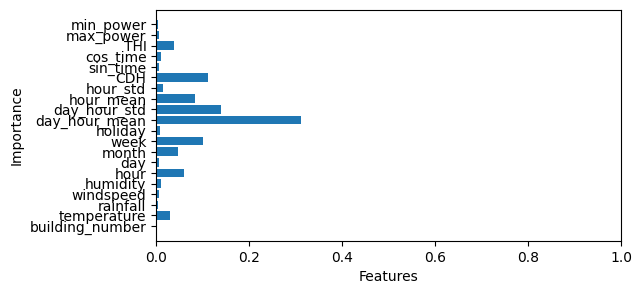

 68%|██████▊   | 68/100 [04:30<02:21,  4.41s/it]

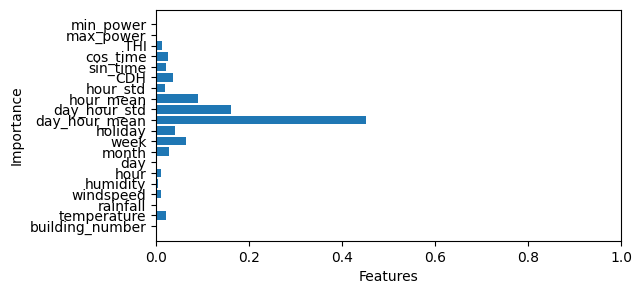

 69%|██████▉   | 69/100 [04:34<02:07,  4.11s/it]

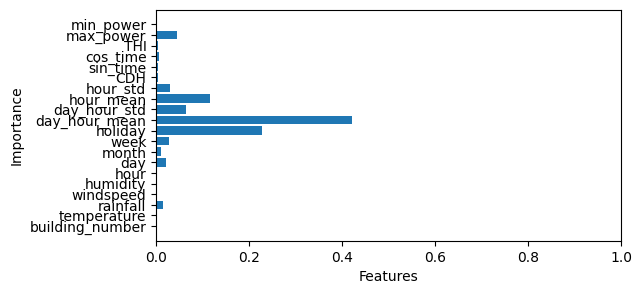

 70%|███████   | 70/100 [04:40<02:22,  4.76s/it]

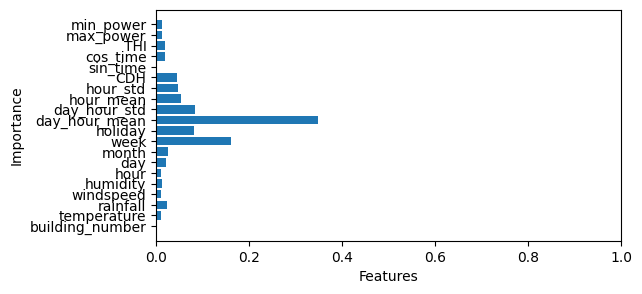

 71%|███████   | 71/100 [04:44<02:09,  4.45s/it]

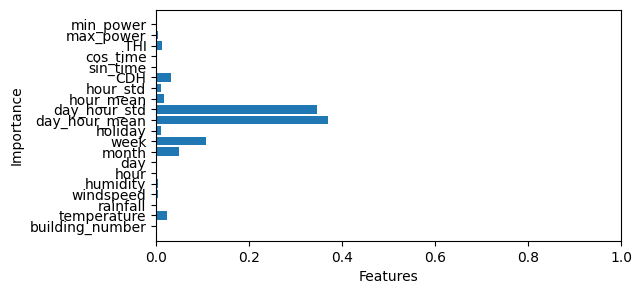

 72%|███████▏  | 72/100 [04:45<01:40,  3.60s/it]

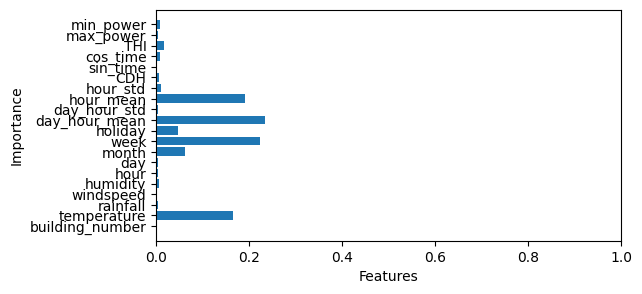

 73%|███████▎  | 73/100 [04:48<01:30,  3.34s/it]

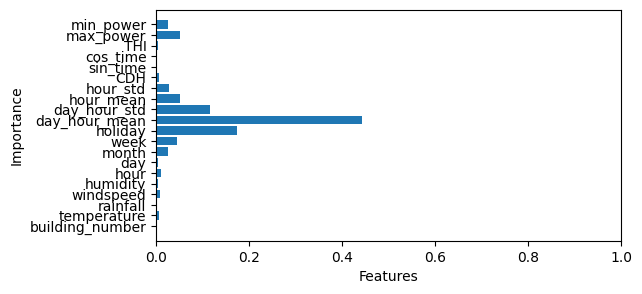

 74%|███████▍  | 74/100 [04:52<01:29,  3.46s/it]

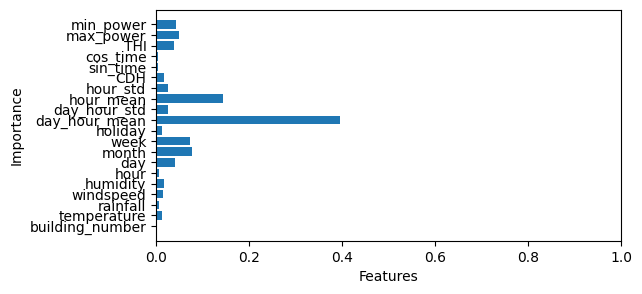

 75%|███████▌  | 75/100 [04:57<01:43,  4.12s/it]

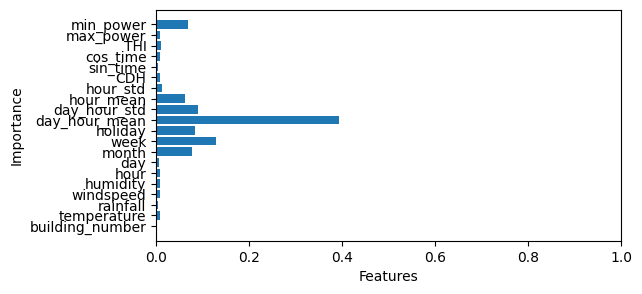

 76%|███████▌  | 76/100 [05:02<01:42,  4.28s/it]

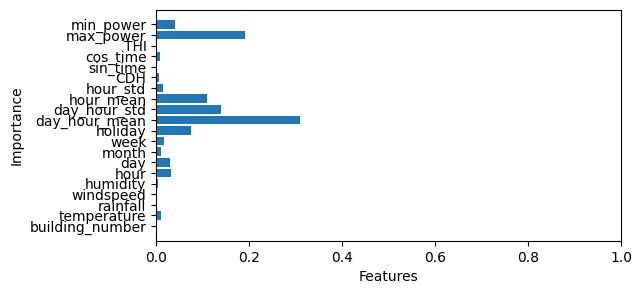

 77%|███████▋  | 77/100 [05:06<01:37,  4.26s/it]

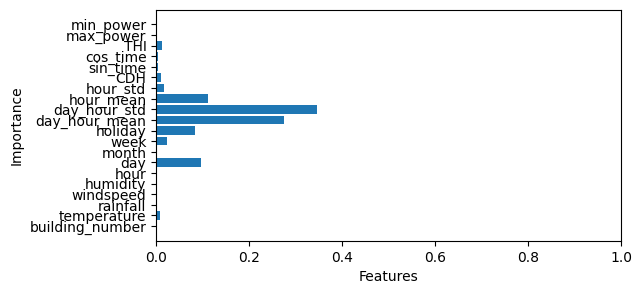

 78%|███████▊  | 78/100 [05:09<01:27,  3.99s/it]

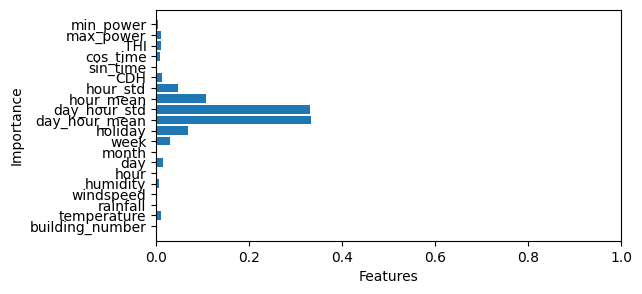

 79%|███████▉  | 79/100 [05:11<01:08,  3.28s/it]

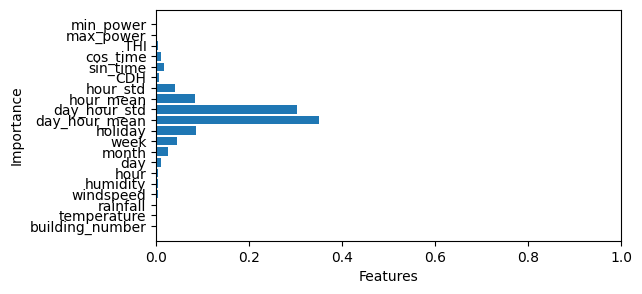

 80%|████████  | 80/100 [05:14<01:04,  3.24s/it]

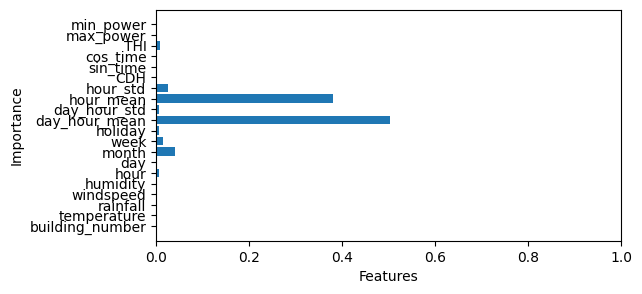

 81%|████████  | 81/100 [05:22<01:25,  4.51s/it]

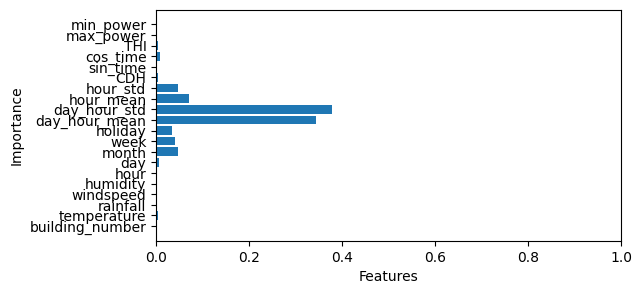

 82%|████████▏ | 82/100 [05:23<01:05,  3.66s/it]

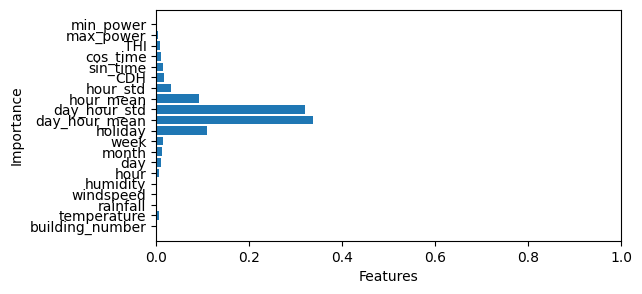

 83%|████████▎ | 83/100 [05:25<00:51,  3.01s/it]

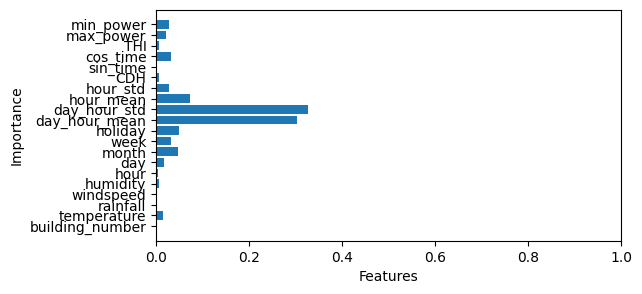

 84%|████████▍ | 84/100 [05:28<00:47,  2.94s/it]

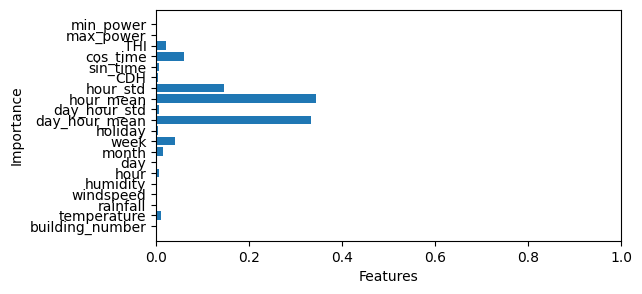

 85%|████████▌ | 85/100 [05:34<00:57,  3.86s/it]

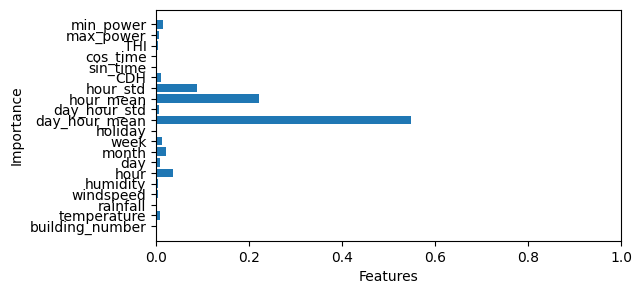

 86%|████████▌ | 86/100 [05:38<00:56,  4.01s/it]

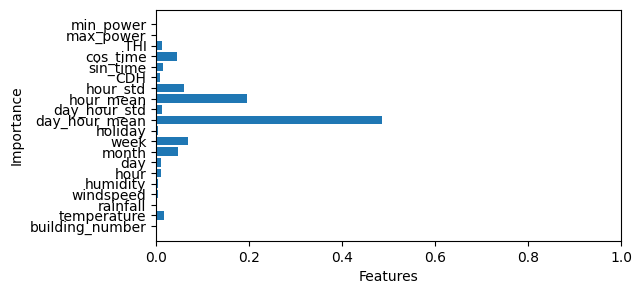

 87%|████████▋ | 87/100 [05:41<00:47,  3.67s/it]

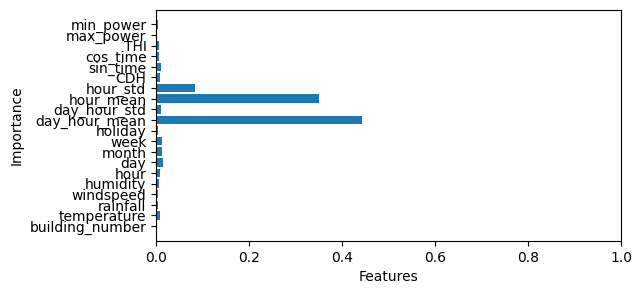

 88%|████████▊ | 88/100 [05:43<00:37,  3.10s/it]

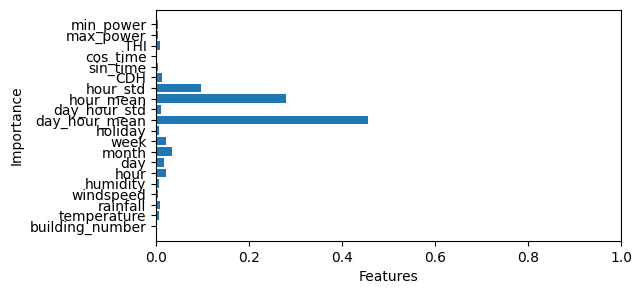

 89%|████████▉ | 89/100 [05:44<00:28,  2.58s/it]

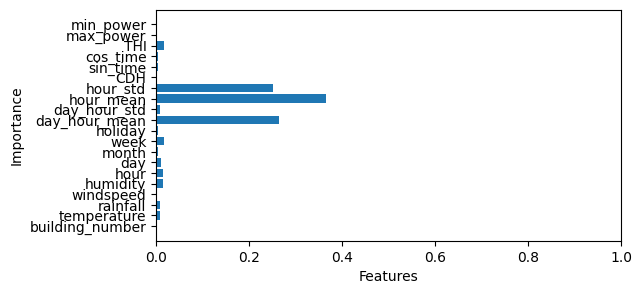

 90%|█████████ | 90/100 [05:47<00:26,  2.65s/it]

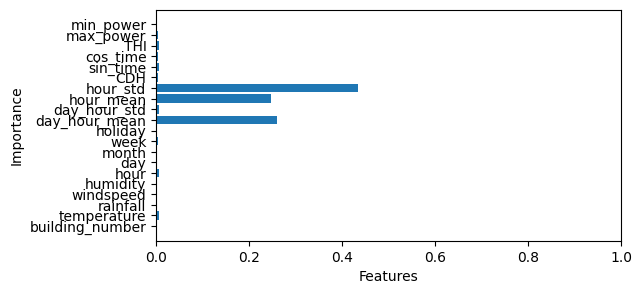

 91%|█████████ | 91/100 [05:50<00:25,  2.83s/it]

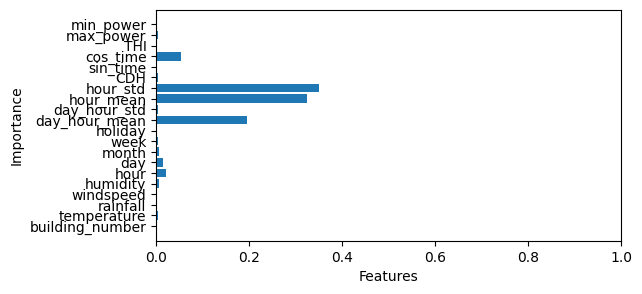

 92%|█████████▏| 92/100 [05:53<00:22,  2.81s/it]

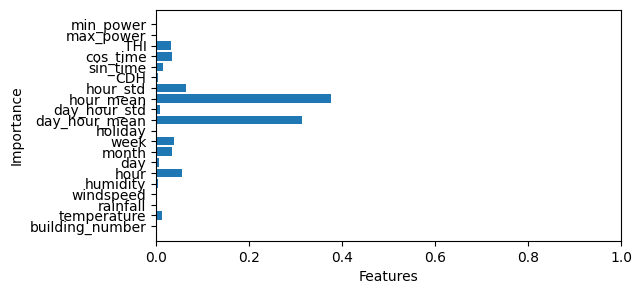

 93%|█████████▎| 93/100 [05:58<00:24,  3.47s/it]

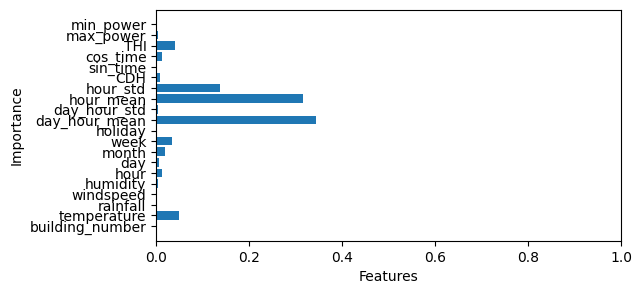

 94%|█████████▍| 94/100 [06:03<00:23,  3.89s/it]

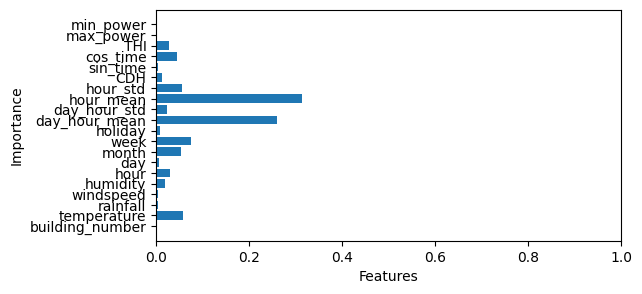

 95%|█████████▌| 95/100 [06:06<00:17,  3.57s/it]

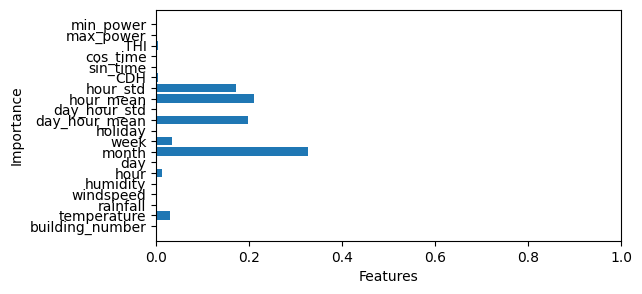

 96%|█████████▌| 96/100 [06:08<00:12,  3.13s/it]

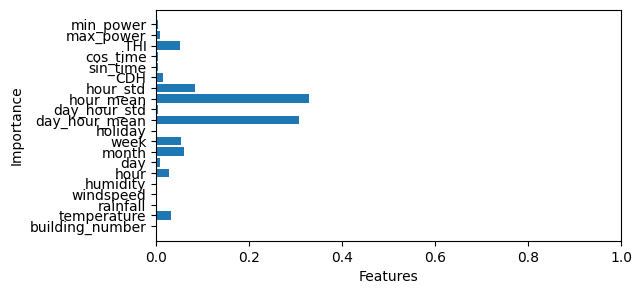

 97%|█████████▋| 97/100 [06:16<00:13,  4.62s/it]

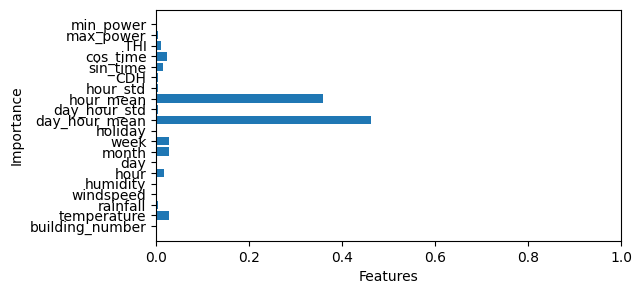

 98%|█████████▊| 98/100 [06:18<00:08,  4.02s/it]

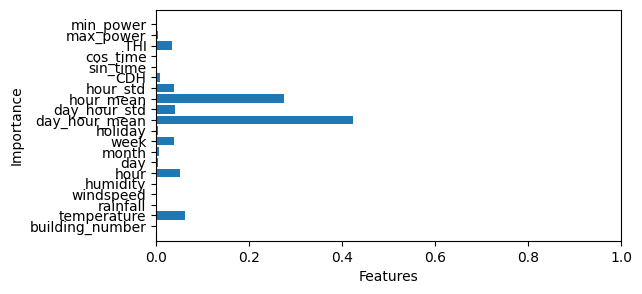

 99%|█████████▉| 99/100 [06:20<00:03,  3.39s/it]

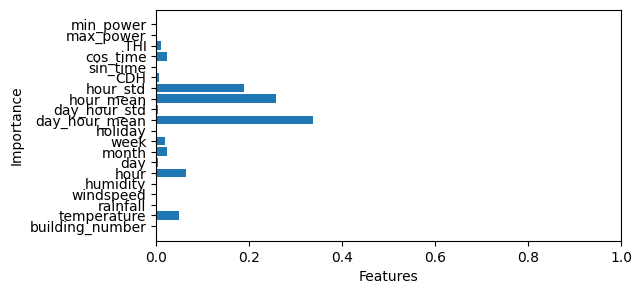

100%|██████████| 100/100 [06:25<00:00,  3.85s/it]


In [3]:
preds = np.array([])
hyper = pd.read_csv('./parameters/hyperparameter_xgb_wsw0808-1540.csv').drop(columns=['Unnamed: 0'])
for i in tqdm(range(100)):
    train_df = pd.read_csv(f'./submit/train_building{i+1}.csv').drop(columns=['Unnamed: 0'])
    test_df = pd.read_csv(f'./submit/test_building{i+1}.csv').drop(columns=['Unnamed: 0'])
    pred_df = pd.DataFrame()   # 시드별 예측값을 담을 data frame
################################################

    feature_importances = []
################################################
    for seed in [0,1,2,3,4,5,6]: # 각 시드별 예측
        y_train = train_df['power_consumption']
        x_train = train_df.drop(columns=['power_consumption'])
        
        x_test = test_df

        xgb = XGBRegressor(seed = seed, tree_method="hist", gpu_id=0,          
                           n_estimators = hyper.iloc[i,6], 
                           eta = hyper.iloc[i, 1],
                           min_child_weight = hyper.iloc[i, 2], max_depth = hyper.iloc[i, 3],
                           colsample_bytree=hyper.iloc[i, 4], subsample=hyper.iloc[i, 5])

        if hyper.iloc[i, 7] != 0:  # 만약 alpha가 0이 아니면 weighted_mse 사용
            xgb.set_params(**{'objective':weighted_mse(hyper.iloc[i,7])})

        xgb.fit(x_train, y_train)
        feature_importances.append(xgb.feature_importances_)
        y_pred = xgb.predict(x_test)
        pred_df.loc[:,seed] = y_pred   # 각 시드별 예측 담기
    
    pred = pred_df.mean(axis=1)        # (i+1)번째 건물의 예측 =  (i+1)번째 건물의 각 시드별 예측 평균값
    preds = np.append(preds, pred)
    average_feature_importances = np.mean(feature_importances, axis=0)
    plt.subplots(figsize=(6, 3))
    plt.barh(x_train.columns, average_feature_importances)
    plt.xlabel('Features')
    plt.xlim(0,1)
    plt.ylabel('Importance')
    plt.show()

In [4]:
submission = pd.read_csv('./data/sample_submission.csv')
submission['answer'] = preds
submission.to_csv(f'./submission/submission_xgb_wsw_realsplit_real.csv', index = False)

In [ ]:
# preds = pd.Series(preds)

# fig, ax = plt.subplots(100, 1, figsize=(100,200), sharex = True)
# ax = ax.flatten()
# for i in range(100):
#     train_df = pd.read_csv(f'./split/train_building{i+1}.csv').drop(columns=['Unnamed: 0'])
#     train_y = train_df['power_consumption']
#     test_y = preds[i*168:(i+1)*168]
#     ax[i].scatter(np.arange(2040) , train_y)
#     ax[i].scatter(np.arange(2040, 2040+168) , test_y)
#     ax[i].tick_params(axis='both', which='major', labelsize=6)
#     ax[i].tick_params(axis='both', which='minor', labelsize=4)
    

# plt.savefig(f'./predict_xgb_wsw{t}.png')
